# Features Images : Réduction de dimension & Clustering
## Sommaire :
- [A - Preprocessing ](#A)
- [B - Visualisations t-SNE](#B)
- [C - ACP ](#C)
- [D - Visualisations t-SNE après réduction de dimension](#D)
- [E - Clustering](#E)
- [F - Visualisations t-SNE avec images](#F)
- [G - Enregistrement des Bag of Visuals Words après réduction de dimension](#G)

In [1]:
%matplotlib inline 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import seaborn as sns
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.manifold import TSNE
from sklearn.cluster import MiniBatchKMeans

## Chargement des fichiers
On récupère les bag of visual words que l'on à créée suite à l'extraction des features des images.

In [2]:
orb_features = pd.read_csv("Data/orb_bow_images.csv")
orb_features

,0,1,2,3,4,5,6,7,8,9,...,200,201,202,203,204,205,206,207,208,209
0,69.0,44.0,44.0,59.0,28.0,62.0,72.0,32.0,53.0,21.0,...,25.0,60.0,37.0,32.0,44.0,61.0,57.0,29.0,50.0,25.0
1,45.0,41.0,24.0,59.0,42.0,51.0,27.0,21.0,44.0,10.0,...,104.0,151.0,10.0,26.0,28.0,47.0,42.0,34.0,89.0,39.0
2,40.0,38.0,27.0,26.0,53.0,36.0,55.0,149.0,26.0,81.0,...,36.0,204.0,106.0,66.0,21.0,22.0,33.0,35.0,37.0,25.0
3,81.0,20.0,42.0,93.0,12.0,41.0,57.0,8.0,85.0,7.0,...,42.0,34.0,22.0,16.0,45.0,89.0,41.0,50.0,60.0,30.0
4,38.0,121.0,69.0,45.0,83.0,42.0,3.0,26.0,44.0,22.0,...,65.0,36.0,5.0,71.0,11.0,17.0,57.0,33.0,42.0,62.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,36.0,110.0,57.0,20.0,189.0,57.0,18.0,124.0,49.0,59.0,...,41.0,115.0,33.0,68.0,10.0,19.0,43.0,37.0,29.0,64.0
1046,30.0,69.0,11.0,11.0,106.0,13.0,15.0,47.0,23.0,18.0,...,20.0,47.0,15.0,31.0,15.0,4.0,39.0,14.0,19.0,14.0
1047,41.0,62.0,101.0,31.0,108.0,52.0,21.0,65.0,52.0,33.0,...,28.0,37.0,58.0,48.0,6.0,12.0,51.0,12.0,44.0,46.0
1048,23.0,25.0,19.0,8.0,129.0,15.0,17.0,66.0,19.0,17.0,...,19.0,78.0,30.0,24.0,31.0,6.0,12.0,13.0,29.0,19.0


In [3]:
sift_features = pd.read_csv("Data/sift_bow_images.csv")
sift_features

,0,1,2,3,4,5,6,7,8,9,...,200,201,202,203,204,205,206,207,208,209
0,221.0,213.0,121.0,110.0,449.0,155.0,367.0,97.0,89.0,1821.0,...,232.0,266.0,249.0,178.0,189.0,373.0,443.0,254.0,59.0,64.0
1,195.0,149.0,173.0,126.0,189.0,167.0,327.0,271.0,100.0,69.0,...,47.0,198.0,99.0,400.0,304.0,235.0,119.0,87.0,102.0,240.0
2,141.0,149.0,178.0,14.0,50.0,110.0,45.0,55.0,23.0,87.0,...,31.0,95.0,19.0,88.0,214.0,94.0,20.0,26.0,64.0,43.0
3,144.0,47.0,80.0,83.0,26.0,98.0,21.0,38.0,31.0,16.0,...,15.0,65.0,14.0,76.0,77.0,67.0,4.0,35.0,115.0,86.0
4,210.0,212.0,157.0,156.0,381.0,287.0,560.0,325.0,260.0,175.0,...,385.0,183.0,566.0,357.0,221.0,445.0,255.0,145.0,196.0,92.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,3.0,1.0,24.0,13.0,12.0,18.0,12.0,16.0,47.0,7.0,...,19.0,9.0,52.0,6.0,6.0,12.0,21.5,21.0,36.0,51.5
1046,1.0,1.0,1.0,1.0,2.0,3.0,6.0,3.0,17.0,4.0,...,29.0,20.0,22.0,24.0,23.0,30.0,21.5,21.0,36.0,51.5
1047,4.0,1.0,11.0,10.0,14.0,3.0,10.0,16.0,17.0,12.0,...,13.0,8.0,23.0,17.0,6.0,7.0,21.5,21.0,36.0,51.5
1048,1.0,0.0,1.0,4.0,6.0,0.0,20.0,1.0,3.0,5.0,...,29.0,20.0,22.0,24.0,23.0,30.0,21.5,21.0,36.0,51.5


On récupère le nom de la catégorie de chaques produits :

In [4]:
categ = pd.read_csv("Data/data_txt.csv")
categ = categ['clean_category']
categ

0       HomeFurnishing
1             BabyCare
2             BabyCare
3       HomeFurnishing
4       HomeFurnishing
             ...      
1045          BabyCare
1046          BabyCare
1047          BabyCare
1048          BabyCare
1049          BabyCare
Name: clean_category, Length: 1050, dtype: object

## A - Preprocessing <a name=A ></a>
On normalise les bag of visual words

In [5]:
# On centre et réduit les valeurs numériques
std_scale = preprocessing.StandardScaler().fit(orb_features)
orb_scaled = std_scale.transform(orb_features)
orb_scaled=pd.DataFrame(orb_scaled)
orb_scaled

,0,1,2,3,4,5,6,7,8,9,...,200,201,202,203,204,205,206,207,208,209
0,0.778185,-0.055916,0.059238,0.916075,-0.494699,1.263764,0.368695,-0.638974,0.077411,-0.537039,...,-0.370886,0.157019,-0.198246,-0.482870,0.281229,0.804871,0.689973,-0.231988,0.892666,-0.734921
1,-0.001888,-0.144560,-0.711034,0.916075,-0.175146,0.730812,-0.432337,-0.890735,-0.205690,-0.839777,...,3.336187,2.761276,-0.716338,-0.788330,-0.332202,0.262137,-0.022108,0.095591,3.231566,0.205317
2,-0.164404,-0.233204,-0.595493,-0.386695,0.075932,0.004061,0.066083,2.038856,-0.771890,1.114259,...,0.145289,4.278041,1.125769,1.248073,-0.600578,-0.707031,-0.449357,0.161107,0.113033,-0.734921
3,1.168222,-0.765067,-0.017790,2.258323,-0.859902,0.246311,0.101685,-1.188272,1.083990,-0.922342,...,0.426839,-0.587055,-0.486075,-1.297431,0.319568,1.890339,-0.069581,1.143844,1.492384,-0.399122
4,-0.229410,2.219276,1.022077,0.363385,0.760689,0.294761,-0.859555,-0.776298,-0.205690,-0.509517,...,1.506113,-0.529818,-0.812281,1.502623,-0.983973,-0.900865,0.689973,0.030075,0.412892,1.749995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,-0.294416,1.894249,0.559914,-0.623563,3.180162,1.021513,-0.592544,1.466671,-0.048412,0.508783,...,0.379914,1.731020,-0.275000,1.349893,-1.022312,-0.823331,0.025364,0.292138,-0.366742,1.884315
1046,-0.489434,0.682783,-1.211711,-0.978864,1.285669,-1.110292,-0.645946,-0.295662,-0.866257,-0.619604,...,-0.605511,-0.215018,-0.620395,-0.533780,-0.830615,-1.404832,-0.164525,-1.214726,-0.966460,-1.473680
1047,-0.131901,0.475947,2.254512,-0.189306,1.331319,0.779263,-0.539142,0.116312,0.045955,-0.206779,...,-0.230111,-0.501200,0.204715,0.331691,-1.175670,-1.094698,0.405140,-1.345758,0.532835,0.675437
1048,-0.716956,-0.617327,-0.903602,-1.097297,1.810649,-1.013392,-0.610345,0.139199,-0.992079,-0.647125,...,-0.652436,0.672146,-0.332566,-0.890151,-0.217184,-1.327299,-1.446271,-1.280242,-0.366742,-1.137881


In [6]:
# On centre et réduit les valeurs numériques
std_scale = preprocessing.StandardScaler().fit(sift_features)
sift_scaled = std_scale.transform(sift_features)
sift_scaled=pd.DataFrame(sift_scaled)
sift_scaled

,0,1,2,3,4,5,6,7,8,9,...,200,201,202,203,204,205,206,207,208,209
0,1.219433,0.584168,1.059147,1.237966,4.219798,1.527320,2.050862,0.803726,0.811058,7.016968,...,2.471711,1.711111,2.786388,0.905966,0.688724,3.428438,2.651855,0.703286,0.192266,0.082589
1,1.048383,0.368945,1.721311,1.472633,1.592739,1.676319,1.789496,2.887107,0.966555,0.039952,...,0.054358,1.187281,0.823476,2.437592,1.275157,1.969250,0.538783,0.146996,0.897392,3.343779
2,0.693124,0.368945,1.784980,-0.170036,0.188273,0.968570,-0.053138,0.300841,-0.121920,0.111634,...,-0.154711,0.393833,-0.223411,0.285036,0.816209,0.478340,-0.106877,-0.056200,0.274257,-0.306531
3,0.712861,0.025932,0.537056,0.841965,-0.054225,0.819570,-0.209958,0.097293,-0.008832,-0.171111,...,-0.363779,0.162732,-0.288841,0.202246,0.117588,0.192846,-0.211226,-0.026220,1.110570,0.490237
4,1.147066,0.580805,1.517568,1.912633,3.532721,3.166318,3.311956,3.533673,3.228320,0.462078,...,4.470928,1.071730,6.934676,2.140926,0.851905,4.189753,1.425752,0.340198,2.438831,0.601414
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,-0.214759,-0.128759,-0.176043,-0.184702,-0.195682,-0.173762,-0.268766,-0.166123,0.217345,-0.206951,...,-0.311512,-0.268657,0.208430,-0.280700,-0.244471,-0.388714,-0.097094,-0.072855,-0.184895,-0.149030
1046,-0.227917,-0.128759,-0.468924,-0.360703,-0.296723,-0.360012,-0.307971,-0.321778,-0.206736,-0.218898,...,-0.180844,-0.183920,-0.184152,-0.156514,-0.157781,-0.198385,-0.097094,-0.072855,-0.184895,-0.149030
1047,-0.208180,-0.128759,-0.341584,-0.228702,-0.175474,-0.360012,-0.281834,-0.166123,-0.206736,-0.187040,...,-0.389913,-0.276360,-0.171066,-0.204808,-0.244471,-0.441583,-0.097094,-0.072855,-0.184895,-0.149030
1048,-0.227917,-0.132122,-0.468924,-0.316703,-0.256307,-0.397262,-0.216492,-0.345725,-0.404641,-0.214916,...,-0.180844,-0.183920,-0.184152,-0.156514,-0.157781,-0.198385,-0.097094,-0.072855,-0.184895,-0.149030


### Renommage des noms de colonne

In [7]:
col_dict = {}
for i in range(len(orb_scaled.columns)):
    old = orb_scaled.columns[i]
    new = 'orb_'+str(old)
    col_dict[old]=new

orb_scaled=orb_scaled.rename(columns=col_dict)
orb_scaled.columns

Index(['orb_0', 'orb_1', 'orb_2', 'orb_3', 'orb_4', 'orb_5', 'orb_6', 'orb_7',
       'orb_8', 'orb_9',
       ...
       'orb_200', 'orb_201', 'orb_202', 'orb_203', 'orb_204', 'orb_205',
       'orb_206', 'orb_207', 'orb_208', 'orb_209'],
      dtype='object', length=210)

In [8]:
col_dict = {}
for i in range(len(sift_scaled.columns)):
    old = sift_scaled.columns[i]
    new = 'sift_'+str(old)
    col_dict[old]=new
    
sift_scaled=sift_scaled.rename(columns=col_dict)
sift_scaled.columns

Index(['sift_0', 'sift_1', 'sift_2', 'sift_3', 'sift_4', 'sift_5', 'sift_6',
       'sift_7', 'sift_8', 'sift_9',
       ...
       'sift_200', 'sift_201', 'sift_202', 'sift_203', 'sift_204', 'sift_205',
       'sift_206', 'sift_207', 'sift_208', 'sift_209'],
      dtype='object', length=210)

## B - Visualiations t-SNE <a name=B ></a>
On va maintenant visualiser nos bag of visual words à l'aide d'un t-SNE

In [9]:
tsne = TSNE(perplexity=40)
orb_tsne_results = tsne.fit_transform(orb_scaled)
sift_tsne_results = tsne.fit_transform(sift_scaled)

In [10]:
orb_tsne_results = pd.DataFrame(orb_tsne_results)
orb_tsne_results

,0,1
0,22.645790,2.734639
1,27.477959,-3.061052
2,-0.797962,-8.526937
3,28.736664,9.418915
4,13.322771,-14.367911
...,...,...
1045,-1.385077,-19.123455
1046,-21.324507,-3.415125
1047,-3.635318,-13.753134
1048,-28.088364,-2.876260


In [11]:
sift_tsne_results = pd.DataFrame(sift_tsne_results)
sift_tsne_results

,0,1
0,-39.388092,18.567310
1,-36.531292,20.647945
2,-29.348284,14.405477
3,-26.372356,18.268166
4,-39.093899,20.686642
...,...,...
1045,-14.218055,-7.697278
1046,14.259363,-10.916353
1047,-6.682755,-7.778258
1048,27.500225,-4.054373


In [12]:
color = ['purple','deepskyblue','red','chocolate','darkorange','forestgreen','royalblue']

<AxesSubplot:xlabel='0', ylabel='1'>

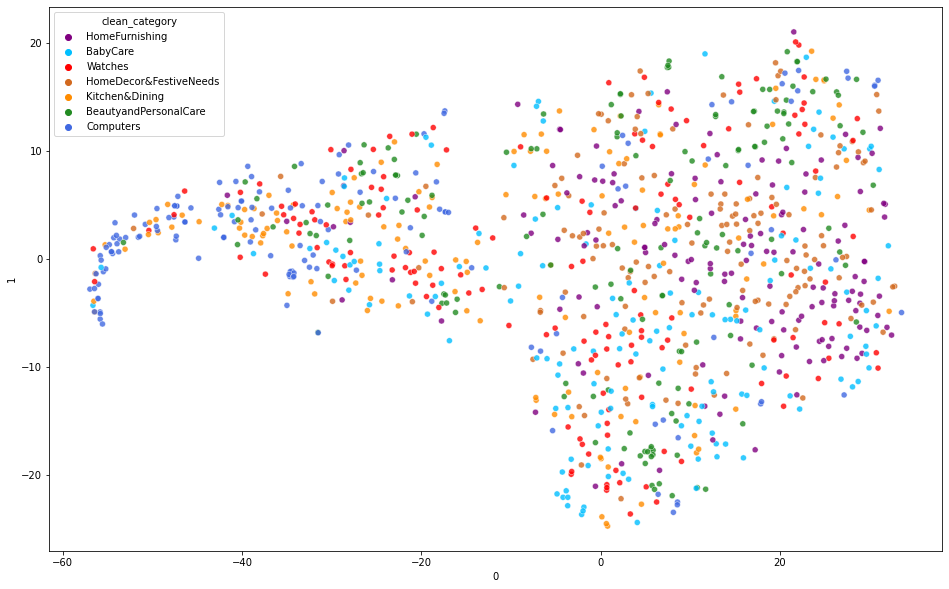

In [13]:
#ORB
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=orb_tsne_results[0], y=orb_tsne_results[1],
    hue=categ,
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

On a colorer chaque produits par sa catégorie. On peut remarquer qu'il ne se dégage pas particulièrement de zones dans lesquels se regroupe distinctivement des produits de catégories spécifiques.

<AxesSubplot:xlabel='0', ylabel='1'>

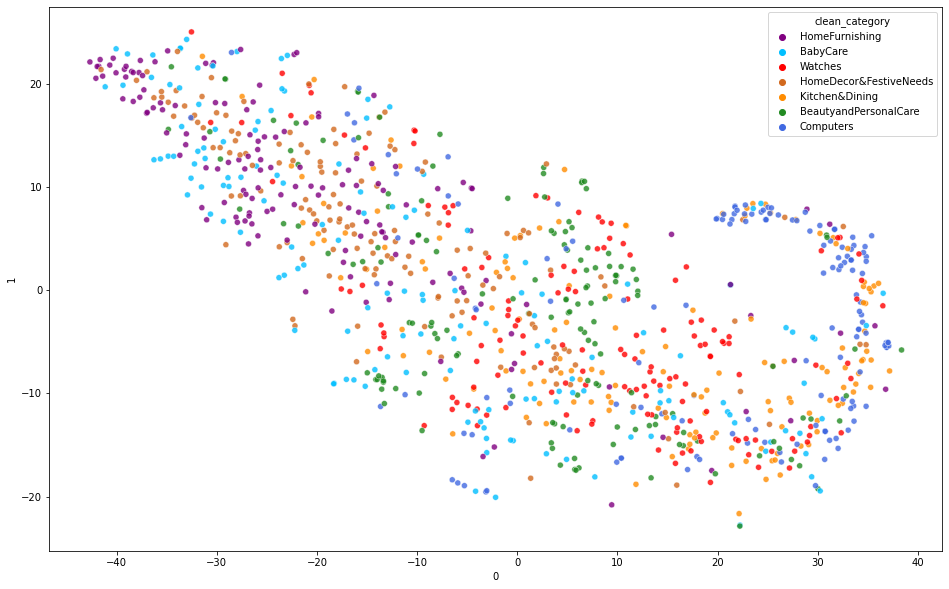

In [14]:
#SIFT
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=sift_tsne_results[0], y=sift_tsne_results[1],
    hue=categ,
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

Comme pour le t-SNE avec ORB il ne se dégage pas particulièrement de zones dans lesquels se regroupe distinctivement des produits de catégories spécifiques. <br>

On va donc maintenant réaliser une réduction de dimension sur nos Bag of Visual Words. On espère pourvoir mieux discriminer les produits de catégories différentes et rassembler ceux de même catégories, en diminuant le bruit. 

## C - ACP <a name=C ></a>

In [15]:
# Calcul des composantes principales - ORB
pca_orb = decomposition.PCA()
pca_orb.fit(orb_scaled)

PCA()

In [16]:
# Calcul des composantes principales - SIFT
pca_sift = decomposition.PCA()
pca_sift.fit(sift_scaled)

PCA()

In [17]:
#nombre de composantes calculées
n_comp_orb=pca_orb.n_components_
n_comp_orb

210

In [18]:
#nombre de composantes calculées
n_comp_sift=pca_sift.n_components_
n_comp_sift

210

In [19]:
#on récupère le noms des variables
orb_features = orb_scaled.columns
orb_features

Index(['orb_0', 'orb_1', 'orb_2', 'orb_3', 'orb_4', 'orb_5', 'orb_6', 'orb_7',
       'orb_8', 'orb_9',
       ...
       'orb_200', 'orb_201', 'orb_202', 'orb_203', 'orb_204', 'orb_205',
       'orb_206', 'orb_207', 'orb_208', 'orb_209'],
      dtype='object', length=210)

In [20]:
#on récupère le noms des variables
sift_features = sift_scaled.columns
sift_features

Index(['sift_0', 'sift_1', 'sift_2', 'sift_3', 'sift_4', 'sift_5', 'sift_6',
       'sift_7', 'sift_8', 'sift_9',
       ...
       'sift_200', 'sift_201', 'sift_202', 'sift_203', 'sift_204', 'sift_205',
       'sift_206', 'sift_207', 'sift_208', 'sift_209'],
      dtype='object', length=210)

In [21]:
#variance expliquée / eigen values
eigval_orb=pca_orb.explained_variance_
print(pd.DataFrame(eigval_orb))

             0
0    66.801020
1    33.987939
2    19.333575
3    11.370298
4     5.577398
..         ...
205   0.031866
206   0.031179
207   0.029411
208   0.026924
209   0.024509

[210 rows x 1 columns]


In [22]:
#variance expliquée / eigen values
eigval_sift=pca_sift.explained_variance_
print(pd.DataFrame(eigval_sift))

              0
0    128.302306
1     17.686513
2     15.013945
3      6.103297
4      5.096389
..          ...
205    0.000100
206    0.000091
207    0.000048
208    0.000029
209    0.000028

[210 rows x 1 columns]


In [23]:
pd.DataFrame(eigval_orb)[pd.DataFrame(eigval_orb)[0]>1].T

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,66.80102,33.987939,19.333575,11.370298,5.577398,5.182774,4.309139,3.211854,2.926263,2.602864,...,2.117971,1.779067,1.73696,1.584778,1.454824,1.413179,1.240388,1.157617,1.074452,1.016118


In [24]:
pd.DataFrame(eigval_sift)[pd.DataFrame(eigval_sift)[0]>1].T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,128.302306,17.686513,15.013945,6.103297,5.096389,4.8546,4.199408,3.849055,2.626503,2.124752,2.011669,1.58837,1.234068,1.141242,1.093426


In [25]:
#calcul de la somme des eigen values (doit être égale à ncomp) 
sum(eigval_orb)

210.2001906577695

In [26]:
#calcul de la somme des eigen values (doit être égale à ncomp) 
sum(eigval_sift)

210.20019065776924

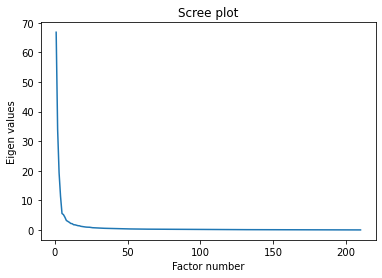

In [27]:
#scree plot
plt.plot(np.arange(1,n_comp_orb+1),eigval_orb)
plt.title("Scree plot")
plt.ylabel("Eigen values")
plt.xlabel("Factor number")
#plt.xlim(0, 10)
plt.show()

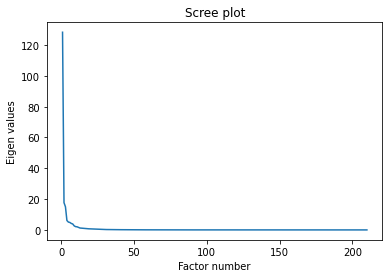

In [28]:
#scree plot
plt.plot(np.arange(1,n_comp_sift+1),eigval_sift)
plt.title("Scree plot")
plt.ylabel("Eigen values")
plt.xlabel("Factor number")
#plt.xlim(0, 10)
plt.show()

In [29]:
#proportion de variance expliquée
prop_eigval_orb=pca_orb.explained_variance_ratio_
pd.DataFrame(prop_eigval_orb.cumsum())

,0
0,0.317797
1,0.479490
2,0.571467
3,0.625560
4,0.652094
...,...
205,0.999467
206,0.999615
207,0.999755
208,0.999883


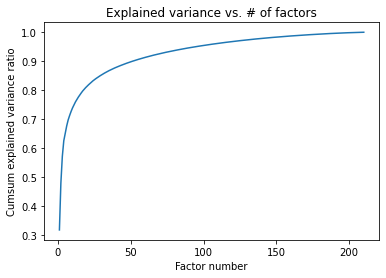

In [30]:
#cumul de variance expliquée
plt.plot(np.arange(1,n_comp_orb+1),np.cumsum(prop_eigval_orb))
plt.title("Explained variance vs. # of factors")
plt.ylabel("Cumsum explained variance ratio")
plt.xlabel("Factor number")
#plt.xlim(0, 10)
plt.show()

In [31]:
pd.DataFrame(prop_eigval_orb.cumsum()).iloc[20]

0    0.818709
Name: 20, dtype: float64

Avec 21 dimensions conservées sur 210 (soit 10%), on conserve plus de 81% de l'information.

In [32]:
#proportion de variance expliquée
prop_eigval_sift=pca_sift.explained_variance_ratio_
pd.DataFrame(prop_eigval_sift.cumsum())

,0
0,0.610381
1,0.694523
2,0.765950
3,0.794985
4,0.819231
...,...
205,0.999999
206,1.000000
207,1.000000
208,1.000000


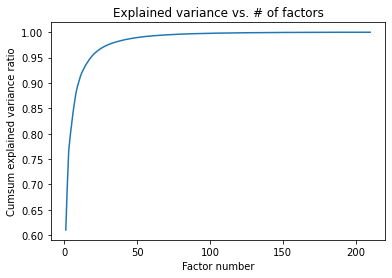

In [33]:
#cumul de variance expliquée
plt.plot(np.arange(1,n_comp_sift+1),np.cumsum(prop_eigval_sift))
plt.title("Explained variance vs. # of factors")
plt.ylabel("Cumsum explained variance ratio")
plt.xlabel("Factor number")
#plt.xlim(0, 10)
plt.show()

In [34]:
pd.DataFrame(prop_eigval_sift.cumsum()).iloc[14]

0    0.936848
Name: 14, dtype: float64

Avec 15 dimensions conservées sur 210 (soit 7%), on conserve plus de 93% de l'information. <br>
On va maintenant réaliser la réduction de dimension :

In [35]:
# Calcul des composantes principales
pca_orb = decomposition.PCA(21)
orb_reduit=pd.DataFrame(pca_orb.fit_transform(orb_scaled))
orb_reduit

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-7.271716,-3.303987,-1.060508,0.661028,-1.697264,0.580267,-1.969198,-2.904587,-0.419316,-0.039395,...,-1.702932,1.077368,2.585651,1.016402,0.915004,0.601396,-0.531533,-0.362421,0.925091,-0.979843
1,-9.399396,-2.608224,-9.297699,-2.406322,0.842912,1.021631,-2.894578,-1.352628,1.881101,0.426499,...,-0.246208,0.549670,-2.824640,0.739035,-0.308716,1.303050,-1.364358,-0.935902,0.767539,-0.640202
2,-2.007475,4.015119,3.073543,2.653236,-1.873650,5.145881,-6.636690,1.107094,-2.864016,3.985150,...,1.421124,-2.045894,-0.968387,-1.188302,0.193132,1.462192,1.381711,1.681843,-3.244011,1.517938
3,-8.984122,-12.335352,-3.399635,-0.471445,-3.659484,-1.958688,0.563032,-0.751776,0.615812,-0.484840,...,0.697540,0.239646,-0.072501,0.340957,-0.944384,-0.237658,-1.500569,0.472136,-0.669938,-0.909249
4,-8.029639,5.710215,-5.748357,0.385176,-1.003060,-4.224482,3.966925,-2.111410,0.568243,0.391717,...,-0.690007,1.216394,0.782715,1.502886,1.767144,0.142406,-1.712145,1.899997,0.820560,0.323684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,-2.179749,11.640641,0.892977,-1.972181,-2.918278,0.255282,1.891690,-0.301303,-0.416190,-0.679961,...,0.657636,0.556730,0.506173,-2.220026,0.336185,-0.607182,-1.381790,-0.550519,0.379788,-0.934210
1046,6.028875,3.398989,-0.869104,-4.155162,0.605528,1.771857,0.903178,-0.080125,0.897760,0.069921,...,0.074734,0.358963,1.197623,-0.232112,0.235593,-0.661824,0.288961,0.122841,-0.726393,0.094157
1047,-5.135909,8.740002,-0.647621,0.257861,-4.453444,-4.543688,3.148688,-1.866375,-1.671432,-1.298538,...,-0.837285,0.615443,0.954505,2.650950,0.553841,1.073807,-0.391960,0.701609,2.231321,0.058437
1048,9.463420,2.968440,-1.188327,-0.445872,1.387110,2.996215,0.486927,1.937707,-0.813252,-1.517031,...,2.487629,0.651453,-0.560559,0.527173,0.851983,-0.174409,-0.850756,1.501447,-1.641647,1.194867


In [36]:
# Calcul des composantes principales
pca_sift = decomposition.PCA(15)
sift_reduit = pd.DataFrame(pca_sift.fit_transform(sift_scaled))
sift_reduit

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,41.850274,6.761947,24.570701,-14.080225,-4.565749,-9.920311,18.450663,5.684990,-14.207283,0.360984,-11.477682,15.022172,-5.157337,8.095433,3.283766
1,24.550376,-3.420865,0.314986,1.074324,0.686718,-2.119568,-3.036862,2.978735,-3.052771,-1.407188,-2.229415,1.558009,-4.197307,-1.174101,-2.538085
2,6.931731,0.425656,2.656023,-1.040276,1.115397,0.467882,0.514683,-0.988511,0.656971,-3.023710,1.500776,0.244344,1.655172,-0.981117,-1.702496
3,3.029134,-0.637058,-0.508561,2.315129,-1.028435,0.096247,-0.077598,-1.011398,0.829360,-0.698171,-0.308381,0.697903,0.015479,0.338270,-0.541431
4,32.108317,-4.129818,-1.923660,-6.217806,3.696965,1.947374,-6.025257,3.447714,-2.604732,2.923663,4.212897,-5.925730,1.410327,3.542763,5.084283
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,-2.515555,-0.209493,-0.653130,-0.524053,0.784065,-0.437628,-0.120913,-0.212037,0.039058,0.331277,-0.019855,-0.319491,0.351889,-0.094885,0.481403
1046,-4.278165,0.310485,-0.309786,0.274689,0.272407,-0.426310,-0.203117,0.050675,0.084857,0.227175,-0.268634,-0.048928,-0.167990,-0.003318,0.116181
1047,-3.262392,0.154535,-0.443842,0.015356,0.439970,-0.201824,-0.468059,0.130237,-0.105942,0.257382,-0.474272,-0.095980,-0.060606,-0.002069,0.351328
1048,-4.043146,0.313639,-0.127837,-0.039503,0.213521,-0.257370,-0.339448,0.322340,-0.256591,0.041157,0.307215,-0.396939,0.003880,0.239055,-0.033942


## D - Visualisations t-SNE après réduction de dimension <a name=D ></a>
Visualison maintenant les produits après réduction de dimension

In [37]:
orb_tsne = TSNE(perplexity=40)
orb_tsne_results = orb_tsne.fit_transform(orb_reduit)
orb_tsne_coord = orb_tsne_results
orb_tsne_results = pd.DataFrame(orb_tsne_results)
orb_tsne_results

,0,1
0,5.337877,-21.431177
1,0.167132,-27.842695
2,-9.739288,2.241374
3,15.165427,-25.723848
4,-15.200593,-12.168287
...,...,...
1045,-19.126129,-0.198896
1046,-5.106308,22.077152
1047,-14.902321,1.391097
1048,-5.556288,26.925398


In [38]:
sift_tsne = TSNE(perplexity=40)
sift_tsne_results = sift_tsne.fit_transform(orb_reduit)
sift_tsne_coord = sift_tsne_results
sift_tsne_results = pd.DataFrame(sift_tsne_results)
sift_tsne_results

,0,1
0,23.965746,-2.004237
1,28.183239,-9.085654
2,-4.151444,-10.066956
3,31.257505,5.376063
4,9.301248,-19.233303
...,...,...
1045,-2.298705,-19.149675
1046,-21.342489,0.395404
1047,2.322642,-16.016890
1048,-26.298616,0.898627


<AxesSubplot:xlabel='0', ylabel='1'>

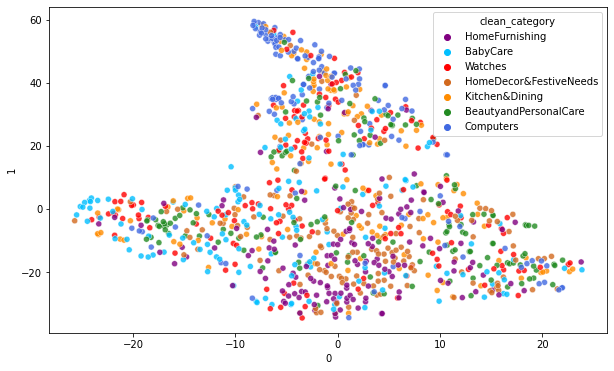

In [39]:
#ORB
plt.figure(figsize=(10,6))
sns.scatterplot(
    x=orb_tsne_results[0], y=orb_tsne_results[1],
    hue=categ,
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

<AxesSubplot:xlabel='0', ylabel='1'>

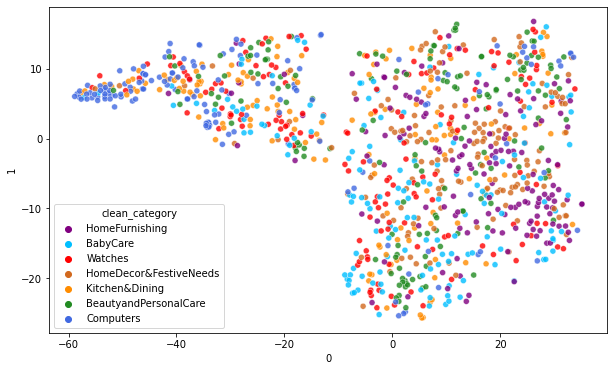

In [40]:
#SIFT
plt.figure(figsize=(10,6))
sns.scatterplot(
    x=sift_tsne_results[0], y=sift_tsne_results[1],
    hue=categ,
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

On peut voir ici que comme pour le t-SNE avant réduction de dimensions, même si on observe quelques regroupement de produit de la même catégorie. L'ensemble des produits restent malgrès tout mélangés. <br>

## E - Clustering <a name=E ></a>

On va quand même réaliser un clustering pour voir si l'on arrive à créer des classes proches des catégories de produits. 

In [41]:
#kmeans sur la matrice post-ACP 
kmeans_orb_acp = MiniBatchKMeans(n_clusters=7, random_state=5)
kmeans_orb_acp.fit(orb_reduit)

MiniBatchKMeans(n_clusters=7, random_state=5)

In [42]:
kmeans_orb_acp.labels_

array([4, 1, 2, ..., 2, 0, 2])

<AxesSubplot:xlabel='0', ylabel='1'>

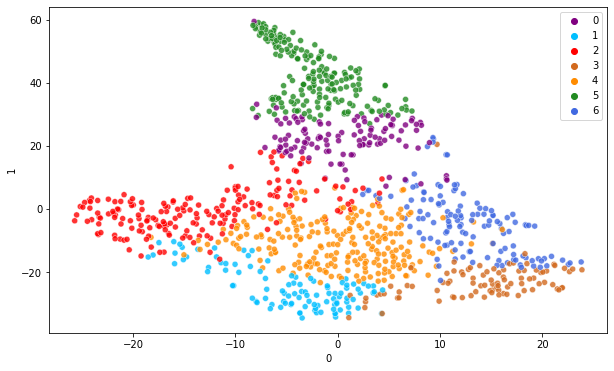

In [43]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x=orb_tsne_results[0], y=orb_tsne_results[1],
    hue=kmeans_orb_acp.labels_,
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

In [46]:
from sklearn.metrics.cluster import adjusted_rand_score
adjusted_rand_score(categ,kmeans_orb_acp.labels_)

0.07736418170614169

Sur ce t-SNE après réduction de dimension et dont les produits ont été colorés suivant le cluster prédit par le k-means on peut voir que des groupes distincts d'individus se dessines. Par contre quand l'on compare avec le t-SNE post-ACP on remarque bien que les culters obtenus avec le k-means ne correspondent pas du tout avec les catégories de produits que l'on s'attend à avoir. Voyons maintenant si on obtient de meilleurs résultats avec les features SIFT :

In [47]:
#kmeans sur la matrice post-ACP 
kmeans_sift_acp = MiniBatchKMeans(n_clusters=7, random_state=5)
kmeans_sift_acp.fit(sift_reduit)

MiniBatchKMeans(n_clusters=7, random_state=5)

In [48]:
kmeans_sift_acp.labels_

array([2, 5, 5, ..., 0, 0, 0])

<AxesSubplot:xlabel='0', ylabel='1'>

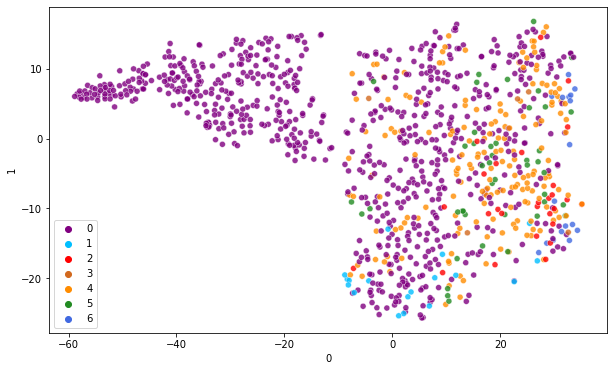

In [49]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x=sift_tsne_results[0], y=sift_tsne_results[1],
    hue=kmeans_sift_acp.labels_,
    palette=color,
    #data=df_subset,
    legend="full",
    alpha=0.8
)

In [50]:
adjusted_rand_score(categ,kmeans_sift_acp.labels_)

0.03725415778440347

Sur ce t-SNE, contrairement au résultats obtenus avec le k-means sur les features ORB, les catégories prédites par le k-means ne sont pas du tout équilibrés. On remarque une catégorie, 0 en violet, qui concentre énormément d'individus ce qui fait que l'on ne retrouve pas non plus ici des catégories qui pourraient se rapprocher des catégories de produits auxquelles on doit prédire. <br>
## F - Visualisations t-SNE avec images <a name=F ></a>
On va maintenant afficher les images des produits à la place des simples points afin de voir plus en détail comment les individus sont répartis. Pour réaliser cette visualisation je me suis servi d'un code proposé sur Kaggle [Source](https://www.kaggle.com/gaborvecsei/plants-t-sne#t-SNE-after-PCA)

In [51]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import cv2

In [52]:
#fonction permettant d'afficher les images sur le t-SNE
def visualize_scatter_with_images(X_2d_data, images, figsize=(45,45), image_zoom=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    for xy, i in zip(X_2d_data, images):
        x0, y0 = xy
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(X_2d_data)
    ax.autoscale()
    plt.show()

In [53]:
#chargement de la liste des images
data =pd.read_csv("Data/desc.csv")
data=data[['uniq_id','image']]

In [54]:
images = []
for pict in data['image']:
    #chargement images
    path = 'Data/Images/'+pict
    img = cv2.imread(path,0)
    img = cv2.resize(img, (150,150))
    img = img.flatten()
    images.append(img)
    
images = np.array(images)
images = [np.reshape(i, (150,150)) for i in images]

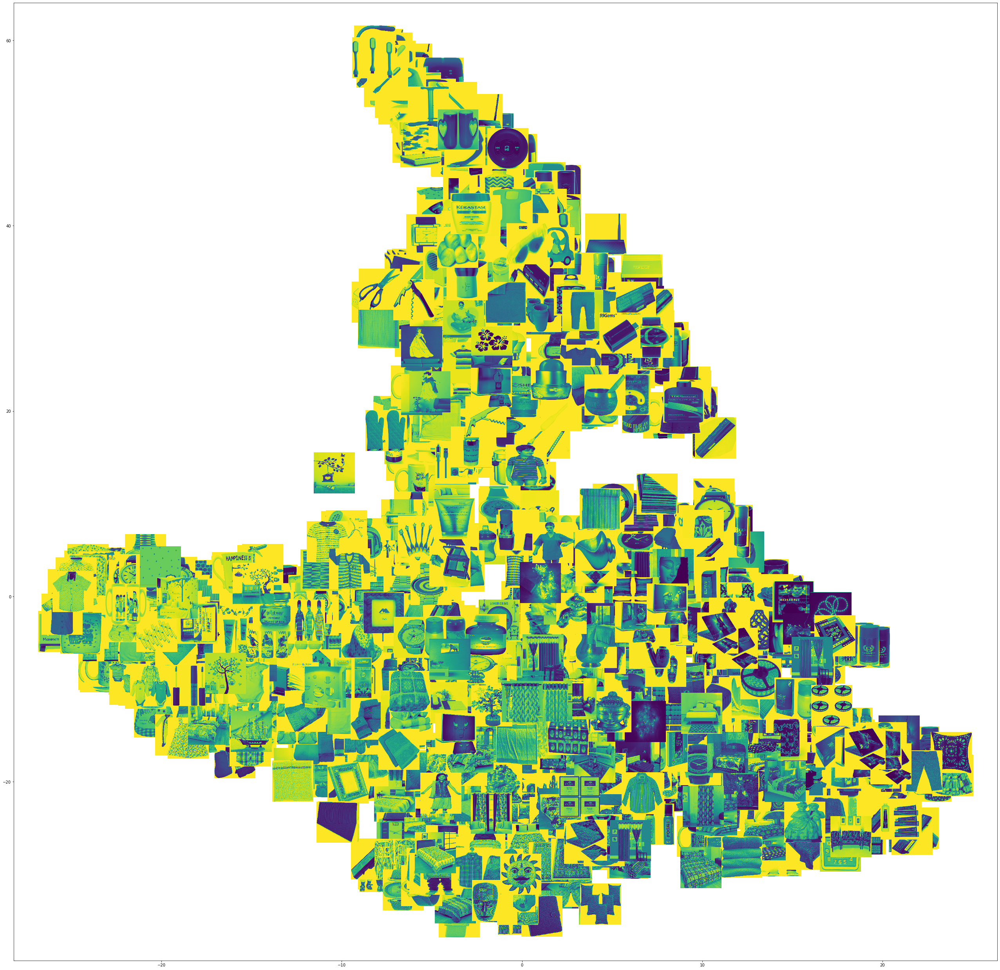

In [55]:
visualize_scatter_with_images(orb_tsne_coord, images, image_zoom=0.7)

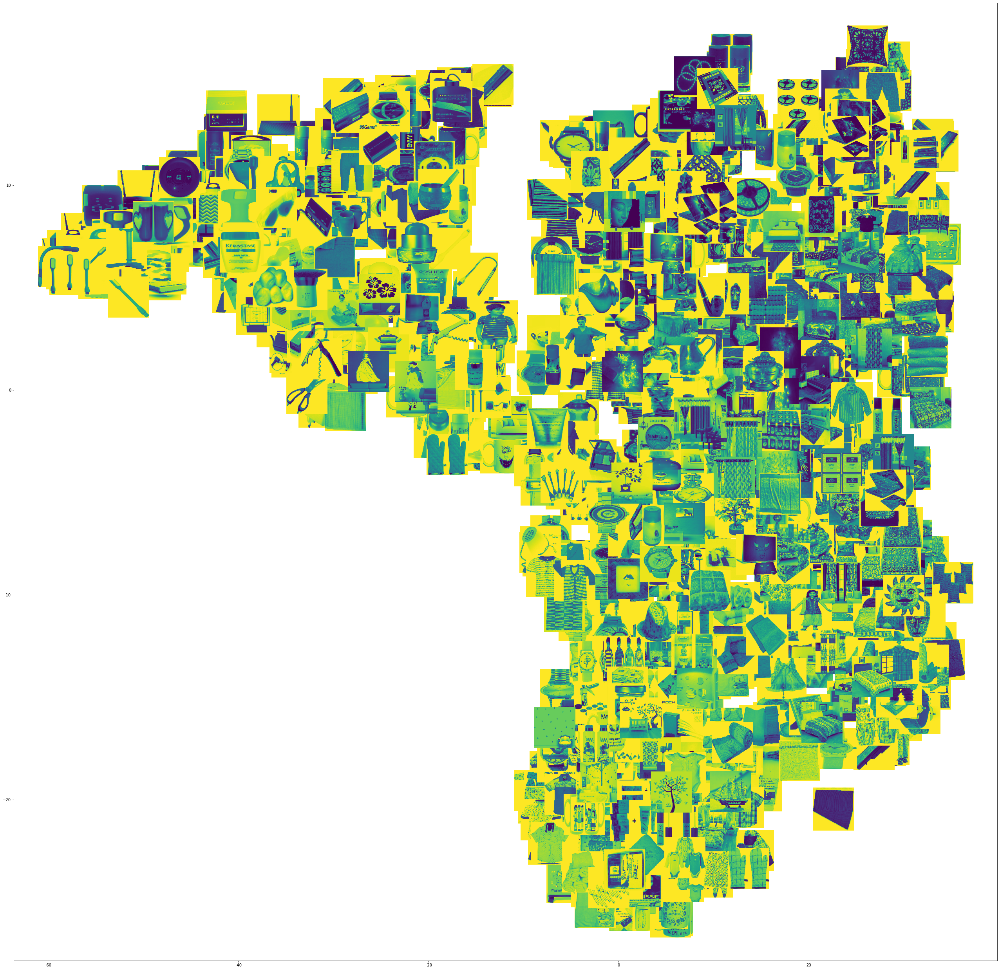

In [56]:
visualize_scatter_with_images(sift_tsne_coord, images, image_zoom=0.7)

On peut remarquer grâce à ces visualisations que même si les produits sont dans l'ensemble mélangés ils semblent regroupés mais pas de la manière dont on le souhaite. En effet, on remarque que les produits ont l'air d'être regroupés suivant leur niveau de gris. Les produits plus sombre d'un côté et les plus clairs de l'autre. Mais ce n'est pas ce qui ici le but du clustring. On va donc essayer une autre méthode d'extraction de features dans un autre notebooks pour voir si elle renvoie de meilleurs résultats que les algorithmes ORB & SIFT. Malgrès tout on enregistre les résultats de la réduction de dimensions ils peuvent peut-être nous être utile pour la suite. 
## G - Enregistrement des Bag of Visuals Words après réduction de dimension <a name=G ></a>

In [57]:
#Enregistrement des Bag of Visuals Words après réduction de dimension
orb_reduit.to_csv("Data/orb_bow_reduit.csv", index = False)
sift_reduit.to_csv("Data/sift_bow_reduit.csv", index = False)